In [1]:
import pickle
import gzip

import os
import os.path as osp
import torch_geometric
import matplotlib.pyplot as plt
from typing import Callable, Dict, List, Optional

import networkx as nx

import torch

import torch_geometric.transforms as T
import torch_geometric.utils as utils

from torch_geometric.data import (
    Data,
    InMemoryDataset,
    download_url,
    extract_tar,
)

import collections

from torch_geometric.utils import k_hop_subgraph

from groq import Groq

# from transformers import BertTokenizer,BertModel

# from sentence_transformers import SentenceTransformer
import pandas as pd
import time

# tokenizer = BertTokenizer.from_pretrained('bert-base-uncased') 
# model = BertModel.from_pretrained("bert-base-uncased")

# sentence = 'I really enjoyed this movie a lot.'

# tokens = tokenizer.tokenize(sentence)
# tokens = ['[CLS]'] + tokens + ['[SEP]']
# T=500
# padded_tokens = tokens + ['[PAD]' for _ in range(T-len(tokens))]
# attn_mask = [ 1 if token != '[PAD]' else 0 for token in padded_tokens  ]

# seg_ids = [0 for _ in range(len(padded_tokens))]

# sent_ids = tokenizer.convert_tokens_to_ids(padded_tokens)
# token_ids = torch.tensor(sent_ids).unsqueeze(0) 
# attn_mask = torch.tensor(attn_mask).unsqueeze(0) 
# seg_ids   = torch.tensor(seg_ids).unsqueeze(0)

# output = model(token_ids, attention_mask=attn_mask,token_type_ids=seg_ids)
# last_hidden_state, pooler_output = output[0], output[1]

# print(last_hidden_state.shape) 
# print(pooler_output.shape) 

# exit()


client = Groq(api_key = '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')





class Wikidata5M(InMemoryDataset):
    def __init__(
        self,
        root: str,
        setting: str = 'transductive',
        transform: Optional[Callable] = None,
        pre_transform: Optional[Callable] = None,
        force_reload: bool = False,
    ) -> None:
        if setting not in {'transductive', 'inductive'}:
            raise ValueError(f"Invalid 'setting' argument (got '{setting}')")

        self.setting = setting

        self.urls = [
            ('https://www.dropbox.com/s/7jp4ib8zo3i6m10/'
             'wikidata5m_text.txt.gz?dl=1'),
            'https://uni-bielefeld.sciebo.de/s/yuBKzBxsEc9j3hy/download',
        ]
        if self.setting == 'inductive':
            self.urls.append('https://www.dropbox.com/s/csed3cgal3m7rzo/'
                             'wikidata5m_inductive.tar.gz?dl=1')
        else:
            self.urls.append('https://www.dropbox.com/s/6sbhm0rwo4l73jq/'
                             'wikidata5m_transductive.tar.gz?dl=1')

        super().__init__(root, transform, pre_transform,
                         force_reload=force_reload)
        self.load(self.processed_paths[0])

    @property
    def raw_file_names(self) -> List[str]:
        return [
            'wikidata5m_text.txt.gz',
            'download',
            f'wikidata5m_{self.setting}_train.txt',
            f'wikidata5m_{self.setting}_valid.txt',
            f'wikidata5m_{self.setting}_test.txt',
        ]

    @property
    def processed_file_names(self) -> str:
        return f'{self.setting}_data.pt'

    def download(self) -> None:
        for url in self.urls:
            download_url(url, self.raw_dir)
        path = osp.join(self.raw_dir, f'wikidata5m_{self.setting}.tar.gz')
        extract_tar(path, self.raw_dir)
        os.remove(path)

    def process(self) -> None:
        # allready done
        pass


## checking edges w/o labels

# Q5230422 P2439 Q1568
# Q5348986 P1962 Q704525
# Q4917 P489 Q11110
# Q2674262 P3484 Q28133204


# root = './data/Wikidata5M'

# node_path = osp.join(root, 'raw', 'wikidata5m_text.txt.gz')

# with gzip.open(node_path, 'rt', encoding='utf-8') as f:
#     for i, line in enumerate(f):
#         values = line.strip().split('\t')
#         if values[0] in {'Q5230422', 'Q1568', 'Q5348986', 'Q704525','Q4917', 'Q11110','Q2674262', 'Q28133204'}:
#             print(values[0], values[1][:100])

# exit()



## check other data for edge labels
# root = './data/Wikidata5M'

# node_path = osp.join(root, 'raw', 'wikidata5m_text_separate_dwnld.txt.gz')
# # node_path = osp.join(root, 'raw', 'wikidata5m_text.txt.gz')

# with gzip.open(node_path, 'rt', encoding='utf-8') as f:
#     for i, line in enumerate(f):
#         values = line.strip().split('\t')
#         if values[0][0] != 'Q': 
#             print(values)

# exit()

## creating label files

# root = './data/Wikidata5M'

# text_nodeID: Dict[int, str] = {}

# node_path = osp.join(root, 'raw', 'wikidata5m_text.txt.gz')

# with gzip.open(node_path, 'rt', encoding='utf-8') as f:
#     for i, line in enumerate(f):
#         values = line.strip().split('\t')
#         text_nodeID[i] = values[1]

# print('saving')

# # Save the dictionary to a file
# with open('nodeID_to_test.pkl', 'wb') as f:
#     pickle.dump(text_nodeID, f)

# exit()



## creating edge labels 

# root = './data/Wikidata5M'
# alias_path = osp.join(root, 'raw', 'wikidata5m_alias.tar.gz')
# text_edge: Dict[str, str] = {}

# with gzip.open(alias_path, 'rt', encoding = "iso-8859-1")  as f: #iso-8859-1
#     for i, line in enumerate(f):
        
#         if line[0] == 'P': 
#           values = line.strip().split('\t')
#           text_edge[values[0]] = values[1]
     

# text_edge.update({'P2439': 'language', 
#  'P1962': 'under the patronage of',
#   'P489': 'represented by',
#   'P3484': 'variant of or similar to'
#   }) # manually created since missing

# # print(text_edge)

# text_edgeID: Dict[int, str] = {}



# rel_to_id: Dict[str, int] = {}


# raw_paths = [
#     f'wikidata5m_transductive_train.txt',
#     f'wikidata5m_transductive_valid.txt',
#     f'wikidata5m_transductive_test.txt',
# ]


# for split, file in enumerate(raw_paths):
#     path = osp.join(root, 'raw', file)
#     with open(path, 'r') as f:
       
#         for line in f:

#             head, rel, tail = line[:-1].split('\t')

#             if rel not in rel_to_id:
#                 rel_to_id[rel] = len(rel_to_id)
#                 try:
#                     text_edgeID[len(rel_to_id)] = text_edge[rel]
#                 except: 
#                     print(head, rel, tail)
# print(len(rel_to_id))
# print(len(text_edge))
# print(len(text_edgeID))


# print('saving')

# # Save the dictionary to a file
# with open('edgeID_to_test.pkl', 'wb') as f:
#     pickle.dump(text_edgeID, f)

# exit()




with open('nodeID_to_test.pkl', 'rb') as f:
    text_nodeID = pickle.load(f)

# print(text_nodeID[10])
# exit()

print('loaded nodes')

with open('edgeID_to_test.pkl', 'rb') as f:
    text_edgeID = pickle.load(f)

print('loaded edges')

# text_nodeID 
# text_edgeID


# from torch_geometric.datasets import Wikidata5M

# Specify the directory where the dataset should be downloaded
root = './data/Wikidata5M'

# Load the dataset
dataset = Wikidata5M(root)

print(len(dataset))

data = dataset[0]  # The dataset is usually accessed as a list of graphs

print(data)
print(f'Number of nodes: {data.num_nodes}')
print(f'Number of edges: {data.num_edges}')
print(f'Edge index: {data.edge_index.shape}')
print(f'Node features: {data.x.shape}')

# print(data.x[0])
# print(data.edge_type[0:10])
# print(data.edge_index[:,0:10])
# print(f'Labels: {data.y.shape}')


import networkx as nx
import demon as d
import igraph as ig
import leidenalg
import random 

g = utils.to_networkx(data)
print(g.number_of_nodes())



c:\Users\annak\.conda\envs\e\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


loaded nodes
loaded edges
1
Data(x=[4815483, 384], edge_index=[2, 20624575], edge_type=[20624575], train_mask=[20624575], val_mask=[20624575], test_mask=[20624575])
Number of nodes: 4815483
Number of edges: 20624575
Edge index: torch.Size([2, 20624575])
Node features: torch.Size([4815483, 384])
4815483


tensor(1359.)
[  40   10   10   20   20 1300]
[4812014    1644     744     535     237     309]


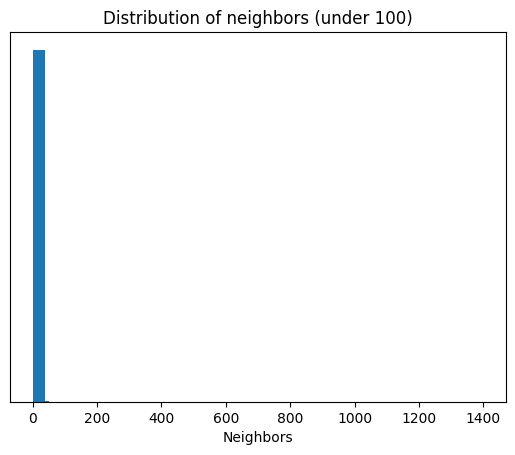

In [29]:
degrees = utils.degree(data.edge_index[0])
print(torch.max(degrees))


bin_edges = [0, 40, 50, 60, 80, 100, 1400]#, 200, 300, 400, 600, 800, 1000, 1400]

# # Calculate histogram values
import numpy as np
hist, bin_edges = np.histogram(degrees, bins=bin_edges)

bin_widths = np.diff(bin_edges)
print(bin_widths)
print(hist)

# Divide bar heights by bin widths
hist_divided = hist / bin_widths

ax = plt.gca()
ax.get_yaxis().set_visible(False)
plt.bar(bin_edges[:-1], hist_divided, width=bin_widths, align='edge')
plt.xlabel('Neighbors')
plt.ylabel('Frequency')
plt.title('Distribution of neighbors (under 100)')
plt.show()

# print(torch.bincount(degrees.to(torch.int32)))

# indices = torch.nonzero(torch.bincount(degrees.to(torch.int32)))


In [62]:
num_nodes_to_pick = 5
random_nodes = random.sample(list(g.nodes()), num_nodes_to_pick)
print(random_nodes)

[4111736, 395028, 547905, 3676750, 3445878]


In [8]:
eg = nx.ego_graph(g, 10, radius = 2, center=True, undirected = True) #10

In [9]:
print('total nodes subgraph: ', eg.number_of_nodes())
# if eg.number_of_nodes() > 500000:
#     print('radius made smaller')
#     eg = nx.ego_graph(g, node, radius = 2, center=True, undirected = True)
#     print('total nodes subgraph smaller: ', eg.number_of_nodes())

# total_subgraph_nodes.append(eg.number_of_nodes())
print(len(list(eg.nodes)))



sorted_x, indices = torch.sort(torch.tensor(list(eg.nodes)))
print(sorted_x)


dm = d.Demon(graph=eg, epsilon=0.25, min_community_size=3) #, file_output=True)
coms = dm.execute()
print('number communities: ', len(coms))
# total_communities.append(len(coms))
print(coms[:10])


total nodes subgraph:  363313
363313
tensor([     10,      48,      85,  ..., 4815451, 4815467, 4815475])


Exec: 100%|████████████████████████

Time:  'execute' 81.22 sec
------------------------------------
number communities:  26
[(2057, 40476, 46113, 60984, 130580, 139841, 161249, 284598, 291495, 318371, 332458, 338779, 341383, 357431, 360268, 373407, 387123, 396276, 420910, 467276, 478172, 505998, 516406, 524133, 528959, 548322, 574229, 577135, 588529, 615319, 655277, 656842, 658044, 658571, 662491, 686620, 709752, 725374, 791022, 796661, 818751, 856953, 887824, 918428, 966850, 976949, 979400, 981651, 1022512, 1035408, 1052514, 1059377, 1068680, 1099603, 1206604, 1265338, 1280731, 1299777, 1312279, 1322816, 1324693, 1363713, 1386558, 1399023, 1412971, 1413846, 1420003, 1438313, 1449336, 1457453, 1468684, 1496264, 1524137, 1570484, 1584977, 1613876, 1643546, 1645377, 1686377, 1689142, 1690865, 1701948, 1791796, 1812115, 1822680, 1826407, 1833184, 1843165, 1855260, 1878082, 1895411, 1907052, 1909419, 1984291, 1990145, 2022107, 2032986, 2060199, 2068540, 2083536, 2099349, 2100066, 2114375, 2177811, 2217606, 2325101, 2355919, 

In [10]:
all_d = []
for c in coms:
    all_d.append(len(c))


partition = torch.tensor(all_d).float()
perason = 3*(torch.mean(partition)-torch.median(partition))/torch.std(partition)
print('pearson: ', perason)

pearson:  tensor(-0.0169)


In [83]:

result = {}

total_things = []
# sum_thing = 0


# Iterate through the list of tuples
for index, tpl in enumerate(coms):
    # if index == 0: 
    #     print(index, tpl)
    total_things += list(tpl)
    # sum_thing += len(tpl)
    for num in tpl:
        # print('inside here')
        
        # print(result[num])
        if num in result.keys():
            result[num] = result[num] + [index]
        else: 
            result[num] = [index]

# print('-----')       
# print(len(result.keys()))
# print(len(eg.nodes))
# print(len(coms))
# print(sum_thing)
print('fraction assigned community: ', len(torch.unique(torch.tensor(total_things)))/len(eg.nodes))
print(len(torch.unique(torch.tensor(total_things))))

# firstpairs = {kl: result[kl] for kl in list(result)[:50]}
# print(firstpairs)

duplicates = []
all_d = []
for val in result.values():
    all_d.append(len(val))
    if len(val) > 1: 
        duplicates.append(len(val))
print('duplicates DEMON: ',  len(duplicates))

partition = torch.tensor(all_d).float()
perason = 3*(torch.mean(partition)-torch.median(partition))/torch.std(partition)
print('pearson: ', perason)
### binst = torch.bincount(partition.to(torch.int32))
### print(len(binst))

# plt.hist(np.array(duplicates))
# plt.show()



# total_duplicates.append(duplicates)


avg_embed = torch.zeros(len(coms), 384)
for c in range(len(coms)): 
    for other_node in coms[c]: # pick that community
        avg_embed[c,:] = avg_embed[c,:] + data.x[other_node]
    avg_embed[c,:] = avg_embed[c,:]/len(coms[c])


correct = 0
bad = 0
try:
    egs = random.sample(list(result.keys()), 1000)
    sa = 1000
except:
    egs = random.sample(list(result.keys()), len(result.keys()))
    sa = len(result.keys())

# print(egs)

# for ee in egs: 
#     if ee not in list(eg.nodes): 
#         print('AWFUL!!!!')
#     if ee not in result.keys():
#         print('TERRIBLE')


for ee in egs: 
    compare_to = data.x[ee]
    value, k_ = torch.max(torch.sum(compare_to*avg_embed, dim=-1), 0)
    try: 
        if k_ in result[ee]:
            correct += 1
    except: 
        bad += 1


print('percent matched: ', correct/(sa-bad))
print('bad total: ', bad)
# total_correct.append(correct/(1000-bad))

fraction assigned community:  0.7355624979392661
178471
duplicates DEMON:  110926
pearson:  tensor(0.4838)
percent matched:  0.028
bad total:  0


In [84]:
h = ig.Graph.from_networkx(g)

In [85]:

partition = leidenalg.find_partition(
    h, 
    leidenalg.ModularityVertexPartition,  # Maximizes modularity by default
)

partition_memb = torch.tensor(partition.membership)



In [87]:
binst = torch.bincount(partition_memb.to(torch.int32))
# print(binst)
print('total bins: ', len(binst))

total bins:  222725


In [111]:
partition = torch.tensor(binst).float()
perason = 3*(torch.mean(partition)-torch.median(partition))/torch.std(partition)
print('pearson: ', perason)

pearson:  tensor(0.0231)


C:\Users\annak\AppData\Local\Temp\ipykernel_39944\2831130576.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  partition = torch.tensor(binst).float()


In [89]:
result = {}

# total_things = []
# sum_thing = 0

comms = {}
for i in range(len(partition_memb)): 
    result[i] = partition_memb[i]

    if partition_memb[i] in comms.keys():
        comms[partition_memb[i]] = comms[partition_memb[i]] + [i]
    else: 
        comms[partition_memb[i]] = [i]


print(len(comms))

4815483


In [90]:
print(len(result))

4815483


In [108]:
coms = {iii:[] for iii in range(len(binst))}
print(len(coms.keys()))
# print(torch.max(partition_memb))
for i in range(len(partition_memb)): 
    # print(partition_memb[i])
    coms[partition_memb[i].item()] += [i]

    # if i == 1000: 
    #     break
    # coms[]
print(len(coms.keys()))

222725
222725


In [109]:
firstpairs = {kl: coms[kl] for kl in list(coms)[:5]}
print(firstpairs)

{0: [4, 6, 8, 9, 11, 15, 23, 25, 27, 29, 52, 53, 57, 60, 61, 66, 68, 82, 88, 91, 94, 95, 96, 102, 108, 118, 122, 131, 139, 142, 143, 153, 158, 162, 168, 180, 184, 192, 200, 217, 220, 222, 231, 239, 240, 242, 245, 250, 256, 260, 261, 262, 268, 273, 280, 282, 284, 299, 300, 304, 307, 310, 311, 317, 319, 320, 328, 335, 341, 350, 356, 357, 359, 360, 374, 376, 387, 388, 390, 398, 400, 406, 409, 411, 416, 418, 421, 422, 431, 432, 434, 437, 442, 444, 446, 453, 460, 473, 475, 478, 484, 487, 492, 515, 529, 531, 539, 551, 554, 558, 562, 569, 575, 576, 587, 590, 595, 599, 600, 612, 614, 629, 634, 641, 642, 663, 675, 681, 693, 695, 698, 701, 708, 709, 711, 714, 731, 736, 738, 741, 743, 744, 748, 749, 754, 770, 771, 773, 777, 786, 794, 796, 801, 807, 820, 821, 824, 835, 838, 839, 842, 843, 845, 851, 853, 856, 857, 877, 882, 888, 899, 901, 903, 907, 910, 918, 919, 935, 940, 961, 962, 963, 965, 976, 977, 990, 991, 993, 994, 999, 1005, 1006, 1010, 1011, 1012, 1019, 1031, 1032, 1033, 1038, 1046, 1049, 

In [110]:
# print(max(result.values()))



avg_embed = torch.zeros(len(binst), 384)
for c in range(len(binst)): 
    for other_node in coms[c]: # pick that community
        avg_embed[c,:] = avg_embed[c,:] + data.x[other_node]
    avg_embed[c,:] = avg_embed[c,:]/len(coms[c])


correct = 0
bad = 0
try:
    egs = random.sample(list(result.keys()), 1000)
    sa = 1000
except:
    egs = random.sample(list(result.keys()), len(result.keys()))
    sa = len(result.keys())

# print(egs)

# for ee in egs: 
#     if ee not in list(eg.nodes): 
#         print('AWFUL!!!!')
#     if ee not in result.keys():
#         print('TERRIBLE')


for ee in egs: 
    compare_to = data.x[ee]
    value, k_ = torch.max(torch.sum(compare_to*avg_embed, dim=-1), 0)
    try: 
        if k_ in result[ee]:
            correct += 1
    except: 
        bad += 1


print('percent matched: ', correct/(sa-bad))
print('bad total: ', bad)
# # total_correct.append(correct/(1000-bad))

percent matched:  0.039
bad total:  0


In [30]:

import numpy as np

num_nodes_to_pick = 5
random_nodes = random.sample(list(g.nodes()), num_nodes_to_pick)

total_subgraph_nodes = []
total_communities = []
total_duplicates = []
total_correct = []

for node in random_nodes: 

    # eg = nx.ego_graph(g, node, radius = 2, center=True, undirected = True) #3
    print('total nodes subgraph: ', eg.number_of_nodes())
    # if eg.number_of_nodes() > 500000:
    #     print('radius made smaller')
    #     eg = nx.ego_graph(g, node, radius = 2, center=True, undirected = True)
    #     print('total nodes subgraph smaller: ', eg.number_of_nodes())

    total_subgraph_nodes.append(eg.number_of_nodes())
    print(len(list(eg.nodes)))
    
   

    # sorted_x, indices = torch.sort(torch.tensor(list(eg.nodes)))
    # print(sorted_x)


#     dm = d.Demon(graph=eg, epsilon=0.25, min_community_size=3) #, file_output=True)
#     coms = dm.execute()
#     print('number communities: ', len(coms))
#     total_communities.append(len(coms))
#     print(coms[:10])

#     result = {}

#     # Iterate through the list of tuples
#     for index, tpl in enumerate(coms):
#         if index == 0: 
#             print(index, tpl)
#         for num in tpl:
#             if num in result: 
#                 result[num] = result[num] + [index]
#             else: 
#                 result[num] = [index]

#     firstpairs = {kl: result[kl] for kl in list(result)[:50]}
#     print(firstpairs)

#     duplicates = []
#     for val in result.values():
#         if len(val) > 1: 
#             duplicates.append(len(val))
#     print('duplicates DEMON: ',  len(duplicates))
    
#     # partition = torch.tensor(duplicates)

#     # binst = torch.bincount(partition.to(torch.int32))
#     # print(len(binst))
#     plt.hist(np.array(duplicates))
 
#     # display histogram
#     plt.show()



#     total_duplicates.append(duplicates)
    

#     avg_embed = torch.zeros(len(coms), 384)
#     for c in range(len(coms)): 
#         for other_node in coms[c]: # pick that community
#             avg_embed[c,:] = avg_embed[c,:] + data.x[other_node]
#         avg_embed[c,:] = avg_embed[c,:]/len(coms[c])


#     correct = 0
#     bad = 0
#     egs = random.sample(list(eg.nodes), 1000)
#     for ee in egs: 
#         compare_to = data.x[ee]
#         value, k_ = torch.max(torch.sum(compare_to*avg_embed, dim=-1), 0)
#         try: 
#             if k_ in result[ee]:
#                 correct += 1
#         except: 
#             bad += 1
        

#     print('percent matched: ', correct/(1000-bad))
#     print('bad total: ', bad)
#     total_correct.append(correct/(1000-bad))

# print('--------------------')
# print(total_subgraph_nodes)
# print(total_communities)
# print(total_duplicates)
# print(total_correct)

total nodes subgraph:  3
3


KeyboardInterrupt: 